In [1]:
import numpy as np
import cv2
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
path = "C:/SWdacon/minseo/data/"
csv_file = path+'train.csv'
train_img_path = path+'train_img/'

In [3]:
# RLE 디코딩 함수
def rle_decode(mask_rle, shape):
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape)

In [4]:
csv = pd.read_csv(csv_file)

In [9]:
img_num = 21

## 이미지 통째로

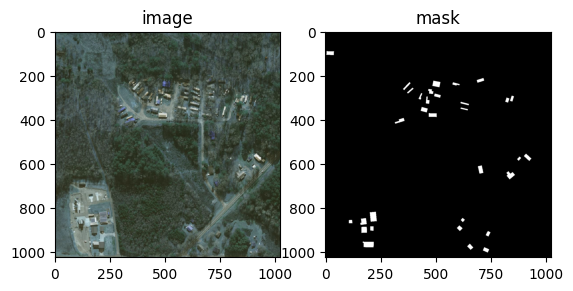

In [6]:
mask_rle = csv.iloc[img_num, 2]
image_path = csv.iloc[img_num, 1]
image = cv2.imread(path+ image_path[2:])
mask = rle_decode(mask_rle, (image.shape[0], image.shape[1]))
fig = plt.figure()
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(image)
ax1.set_title('image')
ax2 = fig.add_subplot(1,2,2)
ax2.imshow(mask,cmap='gray')
ax2.set_title('mask')
plt.show()

## 이미지 4분할

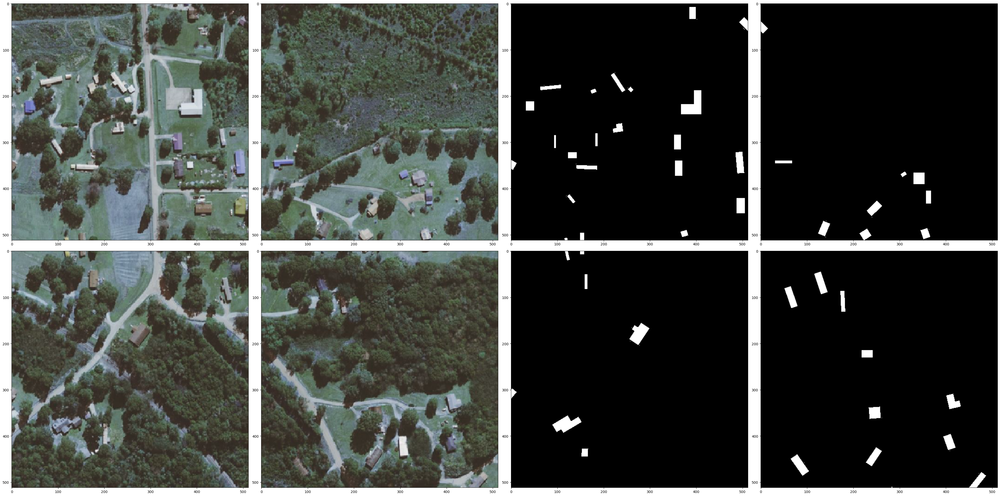

In [10]:
mask_rle = csv.iloc[img_num, 2]
image_path = csv.iloc[img_num, 1]
image = cv2.imread(path+ image_path[2:])
x,y,_ = image.shape
mask = rle_decode(mask_rle, (image.shape[0], image.shape[1]))
img_div = [image[:x//2,:y//2],image[:x//2,y//2:],image[x//2:,:y//2],image[x//2:,y//2:]]
mask_div = [mask[:x//2,:y//2],mask[:x//2,y//2:],mask[x//2:,:y//2],mask[x//2:,y//2:]]
fig = plt.figure(figsize=(40,20))
img_plot = [0,1,4,5]
mask_plot = [2,3,6,7]
for i in range(4):
    ax = fig.add_subplot(2,4,img_plot[i]+1)
    ax.imshow(img_div[i])
    ax = fig.add_subplot(2,4,mask_plot[i]+1)
    ax.imshow(mask_div[i],cmap='gray')
plt.tight_layout()
plt.show()

## 이미지 9분할

In [11]:
mask_rle = csv.iloc[img_num, 2]
image_path = csv.iloc[img_num, 1]
image = cv2.imread(path+ image_path[2:])
x,y,_ = image.shape
mask = rle_decode(mask_rle, (image.shape[0], image.shape[1]))
img_div = [image[:x//3,:y//3],image[:x//3,y//3:y//3*2],image[:x//3,y//3*2:],image[x//3:x//3*2,:y//3],image[x//3:x//3*2,y//3:y//3*2],image[x//3:x//3*2,y//3*2:],image[x//3*2:,:y//3],image[x//3*2:,y//3:y//3*2],image[x//3*2:,y//3*2:]]
mask_div = [mask[:x//3,:y//3],mask[:x//3,y//3:y//3*2],mask[:x//3,y//3*2:],mask[x//3:x//3*2,:y//3],mask[x//3:x//3*2,y//3:y//3*2],mask[x//3:x//3*2,y//3*2:],mask[x//3*2:,:y//3],mask[x//3*2:,y//3:y//3*2],mask[x//3*2:,y//3*2:]]
fig = plt.figure(figsize=(120,60))
img_plot = [0,1,2,6,7,8,12,13,14]
mask_plot = [3,4,5,9,10,11,15,16,17]
for i in range(9):
    ax = fig.add_subplot(3,6,img_plot[i]+1)
    ax.imshow(img_div[i])
    ax = fig.add_subplot(3,6,mask_plot[i]+1)
    ax.imshow(mask_div[i],cmap='gray')
plt.tight_layout()
plt.show()